In [1]:
# Enable outputting results interactively. 
# All the results from code in a given cell will be displayed instead of only the last one.

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
# Standard plotly imports
# import plotly

# plotly.tools.set_credentials_file(username='withwithout', api_key='ZIexWuLtLEEnNjIEFbX3')

import plotly.plotly as py
import plotly.graph_objs as go

import plotly
# from plotly.offline import iplot, init_notebook_mode

# from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


# import plotly.figure_factory as ff

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
# init_notebook_mode(connected=True)

In [3]:
import folium

from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

import geopandas as gpd
import json

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
import pandas as pd
import pickle
import numpy as np
import sqlite3
import math
import datetime

In [6]:
listings =  pickle.load( open( "all_SF_listings.p", "rb" ) )

In [7]:
reviews =  pickle.load( open( "all_SF_reviews.p", "rb" ) )
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,958,5977,2009-07-23,15695,Edmund C,"Our experience was, without a doubt, a five st..."
1,958,6660,2009-08-03,26145,Simon,Returning to San Francisco is a rejuvenating t...
2,958,11519,2009-09-27,25839,Denis,We were very pleased with the accommodations a...
3,958,16282,2009-11-05,33750,Anna,We highly recommend this accomodation and agre...
4,958,26008,2010-02-13,15416,Venetia,Holly's place was great. It was exactly what I...


In [8]:
listings_t = listings.set_index(pd.DatetimeIndex(listings['file_scraped_dt']))
listings_t.head(1)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,958,https://www.airbnb.com/rooms/958,20190503153007,2019-05-03,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,...,f,moderate,f,f,1,1.0,0.0,0.0,1.55,2019-05-03


In [9]:
m_ls = listings_t.resample('D').size().reset_index(name='Counts') 
# m_ls = m_ls[m_ls['Counts']>0]
m_ls

,file_scraped_dt,Counts
0,2015-05-04,5425
1,2015-05-05,0
2,2015-05-06,0
3,2015-05-07,0
4,2015-05-08,0
5,2015-05-09,0
6,2015-05-10,0
7,2015-05-11,0
8,2015-05-12,0
9,2015-05-13,0


(3000, 9500)

Text(0.5, 0, 'Month')

Text(0, 0.5, 'Number of Active Listings')

Text(0.5, 1.0, 'Number of Active Listings on Airbnb: May 2015 - May 2019')

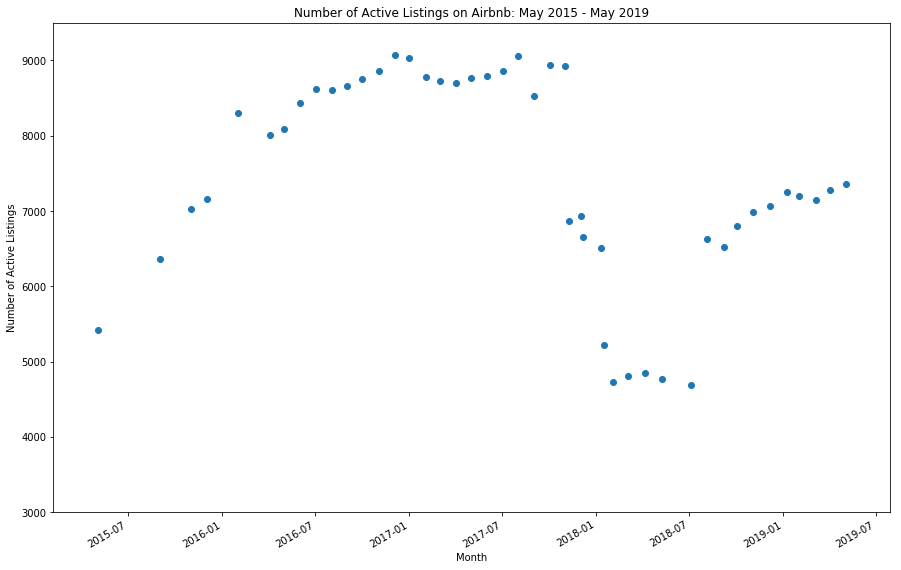

In [83]:
import matplotlib.dates as mdates

times = pd.date_range('2015-05-04', periods=1461, freq='D')

fig, ax = plt.subplots(1,figsize = (15,10))
fig.autofmt_xdate()
plt.scatter(times, m_ls['Counts'])
ax.set_ylim(3000,9500)
plt.xlabel("Month")
plt.ylabel("Number of Active Listings")
plt.title("Number of Active Listings on Airbnb: May 2015 - May 2019")

xfmt = mdates.DateFormatter('%m-%d-%y')
# ax.xaxis.set_major_formatter(xfmt)

plt.show()

In [11]:
# pd.crosstab(listings['id'],listings['file_scraped_dt'],margins=True)

In [12]:
f = lambda x: 'BED & BREAKFAST' if x == 'BED AND BREAKFAST' else x

listings['property_type_c'] = listings['property_type'].str.upper().map(f)

In [13]:
sub = listings[['file_scraped_dt','id','host_since','host_id','property_type_c', 'room_type', 'minimum_nights', 'neighbourhood', 'review_scores_rating', 'review_scores_accuracy','review_scores_communication','review_scores_cleanliness','review_scores_location','review_scores_checkin','review_scores_value']]
sub.shape

(334790, 15)

In [14]:
conn = sqlite3.connect("airbnb.db")
sub.to_sql('listings_db', conn, if_exists='replace')

In [15]:
reviews.to_sql('reviews', conn, if_exists='replace')

In [16]:
ls_reviews = pd.read_sql_query(
    'select listing_id, min(date) as first_review_dt,max(date) as last_review_dt, count(*) as count_reviews from reviews group by listing_id order by count_reviews desc;' ,conn)

ls_reviews['reviews_history_month'] = (pd.to_datetime(ls_reviews['last_review_dt']) - pd.to_datetime(ls_reviews['first_review_dt']))/np.timedelta64(1, 'M')

ls_reviews.head()


,listing_id,first_review_dt,last_review_dt,count_reviews,reviews_history_month
0,545685,2012-06-28,2019-04-28,731,81.972936
1,8739,2009-08-01,2019-04-30,708,116.930532
2,205842,2012-07-22,2019-01-01,674,77.340397
3,1920033,2013-11-22,2019-05-01,660,65.249800
4,585326,2012-07-14,2019-04-27,652,81.414403


In [17]:
ls_reviews['reviews_history_month'].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Booking History of a Listing <br> Months Difference between the First Review Date and the Last Review Date')

In [18]:
ls_reviews['count_reviews'].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Number of Reviews',
    yTitle='(%) of Listings',
    title='Number of Reviews for a Listing')

In [19]:
plus5_reviews = ls_reviews[ls_reviews['count_reviews']>= 5]

plus5_reviews['count_reviews'].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Number of Reviews',
    yTitle='(%) of Listings',
    title='Number of Reviews for a Listing <br> Listing with a minimum of 5 reviews')

In [20]:
ls_reviews.to_sql('ls_reviews', conn, if_exists='replace')

In [21]:
tab1 = pd.read_sql_query(
    'select id as listing_id, property_type_c, room_type, host_since, min(file_scraped_dt) as first_scraped_dt, max(file_scraped_dt) as last_scraped_dt from listings_db group by id;' ,conn)
tab1.head()

tab1.shape


,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt
0,958,APARTMENT,Entire home/apt,2008-07-31,2015-05-04,2019-05-03
1,2822,HOUSE,Private room,2008-09-24,2015-09-02,2016-06-02
2,3850,HOUSE,Private room,2008-12-08,2015-05-04,2015-05-04
3,5021,APARTMENT,Entire home/apt,2009-01-29,2016-12-03,2018-01-17
4,5193,APARTMENT,Entire home/apt,2009-02-05,2015-05-04,2017-03-02


(29533, 6)

In [22]:
tab1.to_sql('ls_dt_range', conn, if_exists='replace')


In [23]:
ls_tab = pd.read_sql_query(
    'select a.*, b.first_review_dt, b.last_review_dt, b.count_reviews, b.reviews_history_month from ls_dt_range as a left join ls_reviews as b on a.listing_id = b.listing_id',conn)

ls_tab.head()

,index,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month
0,0,958,APARTMENT,Entire home/apt,2008-07-31,2015-05-04,2019-05-03,2009-07-23,2019-04-17,192.0,116.799113
1,1,2822,HOUSE,Private room,2008-09-24,2015-09-02,2016-06-02,2010-07-25,2016-05-08,55.0,69.455225
2,2,3850,HOUSE,Private room,2008-12-08,2015-05-04,2015-05-04,2009-07-16,2015-01-01,120.0,65.545494
3,3,5021,APARTMENT,Entire home/apt,2009-01-29,2016-12-03,2018-01-17,2011-07-04,2017-12-31,6.0,77.931785
4,4,5193,APARTMENT,Entire home/apt,2009-02-05,2015-05-04,2017-03-02,2009-09-29,2016-12-20,309.0,86.704039


In [24]:

ls_tab['listing_month_diff'] = (pd.to_datetime(ls_tab['last_scraped_dt']) - pd.to_datetime(ls_tab['first_review_dt']))/np.timedelta64(1, 'M')
ls_tab['listing_day_diff'] = (pd.to_datetime(ls_tab['last_scraped_dt']) - pd.to_datetime(ls_tab['first_review_dt'])).dt.days


ls_tab['review_month_diff'] = (pd.to_datetime(ls_tab['last_review_dt']) - pd.to_datetime(ls_tab['first_review_dt']))/np.timedelta64(1, 'M')
ls_tab['review_day_diff'] = (pd.to_datetime(ls_tab['last_review_dt']) - pd.to_datetime(ls_tab['first_review_dt'])).dt.days


ls_tab.head()



,index,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month,listing_month_diff,listing_day_diff,review_month_diff,review_day_diff
0,0,958,APARTMENT,Entire home/apt,2008-07-31,2015-05-04,2019-05-03,2009-07-23,2019-04-17,192.0,116.799113,117.324791,3571.0,116.799113,3555.0
1,1,2822,HOUSE,Private room,2008-09-24,2015-09-02,2016-06-02,2010-07-25,2016-05-08,55.0,69.455225,70.276597,2139.0,69.455225,2114.0
2,2,3850,HOUSE,Private room,2008-12-08,2015-05-04,2015-05-04,2009-07-16,2015-01-01,120.0,65.545494,69.586644,2118.0,65.545494,1995.0
3,3,5021,APARTMENT,Entire home/apt,2009-01-29,2016-12-03,2018-01-17,2011-07-04,2017-12-31,6.0,77.931785,78.490318,2389.0,77.931785,2372.0
4,4,5193,APARTMENT,Entire home/apt,2009-02-05,2015-05-04,2017-03-02,2009-09-29,2016-12-20,309.0,86.704039,89.069591,2711.0,86.704039,2639.0


In [25]:
# ls_tab.sort_values(by='listing_month_diff')

In [26]:
no_reviews = ls_tab[ls_tab['first_review_dt'].isnull()]
no_reviews.head()

no_reviews.shape

#8514 listings have no reviews. 

,index,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month,listing_month_diff,listing_day_diff,review_month_diff,review_day_diff
7,7,6810,HOUSE,Entire home/apt,2009-05-03,2017-01-01,2017-03-02,None,None,NaN,NaN,NaN,NaN,NaN,NaN
8,8,6906,APARTMENT,Shared room,2009-05-08,2016-10-01,2016-10-01,None,None,NaN,NaN,NaN,NaN,NaN,NaN
57,57,22278,APARTMENT,Entire home/apt,2010-02-25,2017-03-02,2017-03-02,None,None,NaN,NaN,NaN,NaN,NaN,NaN
58,58,22955,APARTMENT,Entire home/apt,2010-03-04,2016-12-03,2016-12-03,None,None,NaN,NaN,NaN,NaN,NaN,NaN
87,87,27707,HOUSE,Entire home/apt,2010-05-07,2015-05-04,2018-01-17,None,None,NaN,NaN,NaN,NaN,NaN,NaN


(8514, 15)

In [27]:
ls_w_reviews = ls_tab[pd.notna(ls_tab['first_review_dt'])]
ls_w_reviews.shape

(21019, 15)

In [28]:
ls_tab[ls_tab['listing_month_diff']<=0]

,index,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month,listing_month_diff,listing_day_diff,review_month_diff,review_day_diff
17518,17518,13802856,APARTMENT,Private room,2016-04-21,2016-07-02,2016-07-02,2016-07-02,2016-07-02,2.0,0.0,0.0,0.0,0.0,0.0
19165,19165,15289877,HOUSE,Entire home/apt,2016-09-23,2016-10-01,2016-10-01,2016-10-01,2016-10-01,1.0,0.0,0.0,0.0,0.0,0.0
27775,27775,29566422,APARTMENT,Entire home/apt,2018-10-25,2018-11-03,2018-11-03,2018-11-03,2018-11-03,1.0,0.0,0.0,0.0,0.0,0.0


In [29]:
# the chart excludes listings with no reviews.

ls_w_reviews[['listing_month_diff']].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Longevity of a Listing <br> Months Difference between the First Review Date and the Last Scraped Date')

In [30]:
# the chart includes listings with no reviews.

ls_tab[['listing_month_diff']].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Longevity of a Listing <br> Months Difference between the First Review Date and the Last Scraped Date')

In [31]:
scores = pd.read_sql_query(
    'select id as listing_id, avg(review_scores_rating) as overall_scores, avg(review_scores_accuracy) as accuracy_scores,avg(review_scores_communication) as communication_scores,avg(review_scores_cleanliness) as cleaniness_scores,avg(review_scores_location) as location_scores,avg(review_scores_checkin) as checkin_scores,avg(review_scores_value) as value_scores from listings_db group by listing_id order by overall_scores',conn)

scores.head()




,listing_id,overall_scores,accuracy_scores,communication_scores,cleaniness_scores,location_scores,checkin_scores,value_scores
0,6810,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,22278,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,22955,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,27707,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
scores.to_sql('scores_db', conn, if_exists='replace')

In [33]:
ls_tab.to_sql('ls_tab_db', conn, if_exists='replace')

ls_tab2 = pd.read_sql_query(
    'select a.*, b.overall_scores, b.accuracy_scores, b.communication_scores, b.cleaniness_scores, b.location_scores, b.checkin_scores,b.value_scores from ls_tab_db as a left join scores_db as b on a.listing_id = b.listing_id',conn)

ls_tab2.head()

,level_0,index,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,...,listing_day_diff,review_month_diff,review_day_diff,overall_scores,accuracy_scores,communication_scores,cleaniness_scores,location_scores,checkin_scores,value_scores
0,0,0,958,APARTMENT,Entire home/apt,2008-07-31,2015-05-04,2019-05-03,2009-07-23,2019-04-17,...,3571.0,116.799113,3555.0,97.022222,10.0,10.0,10.00,10.0000,10.0,9.866667
1,1,1,2822,HOUSE,Private room,2008-09-24,2015-09-02,2016-06-02,2010-07-25,2016-05-08,...,2139.0,69.455225,2114.0,98.000000,10.0,10.0,10.00,9.0000,10.0,10.000000
2,2,2,3850,HOUSE,Private room,2008-12-08,2015-05-04,2015-05-04,2009-07-16,2015-01-01,...,2118.0,65.545494,1995.0,93.000000,9.0,10.0,9.00,9.0000,10.0,9.000000
3,3,3,5021,APARTMENT,Entire home/apt,2009-01-29,2016-12-03,2018-01-17,2011-07-04,2017-12-31,...,2389.0,77.931785,2372.0,90.666667,9.0,10.0,9.00,10.0000,10.0,8.000000
4,4,4,5193,APARTMENT,Entire home/apt,2009-02-05,2015-05-04,2017-03-02,2009-09-29,2016-12-20,...,2711.0,86.704039,2639.0,92.812500,9.0,10.0,9.75,9.9375,10.0,9.000000


In [34]:
ls_tab2.columns

Index(['level_0', 'index', 'listing_id', 'property_type_c', 'room_type',
       'host_since', 'first_scraped_dt', 'last_scraped_dt', 'first_review_dt',
       'last_review_dt', 'count_reviews', 'reviews_history_month',
       'listing_month_diff', 'listing_day_diff', 'review_month_diff',
       'review_day_diff', 'overall_scores', 'accuracy_scores',
       'communication_scores', 'cleaniness_scores', 'location_scores',
       'checkin_scores', 'value_scores'],
      dtype='object')

In [35]:
ls_tab2.drop(['level_0'], axis = 1).to_sql('listings_scores_db', conn, if_exists='replace')

In [36]:
# Relationship between longevity of a listing and scores

trace = go.Scatter(
    x = ls_tab2['overall_scores'],
    y = ls_tab2['listing_month_diff'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Overall Review Scores vs Longevity of a Listing',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Average Review Scores',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Longevty of a Listing',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [38]:
# Relationship between number of reviews and length of booking history


trace = go.Scatter(
    x = ls_reviews['reviews_history_month'],
    y = ls_reviews['count_reviews'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Length of Booking History vs Number of Reviews',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Approximation of Booking History in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Number of Reviews',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

# Plot and embed in ipython notebook!
# py.iplot(data, xTitle = "Length of Booking History in Months", yTitle = "Number of Reviews")

In [39]:

trace = go.Scatter(
    x = ls_tab['listing_month_diff'],
    y = ls_tab['count_reviews'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Longevity of a Listing vs Number of Reviews',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Longevity of a Listing in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Number of Reviews',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [40]:
trace = go.Scatter(
    x = ls_tab['listing_month_diff'],
    y = ls_tab['review_month_diff'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Longevity of a Listing vs Approximation of Booking History',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Longevity of a Listing in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Approximation of Booking History in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [44]:
ls_tab_trunc = ls_tab[ls_tab['last_scraped_dt'] != '2019-05-03']
ls_tab_trunc.head(1)

,index,listing_id,property_type_c,room_type,host_since,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month,listing_month_diff,listing_day_diff,review_month_diff,review_day_diff
1,1,2822,HOUSE,Private room,2008-09-24,2015-09-02,2016-06-02,2010-07-25,2016-05-08,55.0,69.455225,70.276597,2139.0,69.455225,2114.0


In [45]:
# ls_tab['year'] = pd.to_datetime(ls_tab['last_scraped_dt']).dt.year 
# ls_tab['month'] = pd.to_datetime(ls_tab['last_scraped_dt']).dt.month
# ls_tab.head()

# ls_tab_truncated = ls_tab[not (ls_tab['year'] == 2019 and ls_tab['month'] == 5)]
# # sub2 = listings_t_truncated[['file_scraped_dt','id','host_since','host_id']]

ls_tab_trunc[['last_scraped_dt']].iplot(
    kind='hist',
#     histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Last Scraped Date')


# Some listngs may have legitimately disappeared as of May 2019. It's unknown unless the next month's scrape is available.

In [46]:
# last listing date for a given host

tab2 = pd.read_sql_query(
    'select host_id, host_since, max(file_scraped_dt) as last_scraped_dt from dt_range group by host_id;' ,conn)

tab2['host_month_diff'] = (pd.to_datetime(tab2['last_scraped_dt']) - pd.to_datetime(tab2['host_since']))/np.timedelta64(1, 'M')
tab2.head()

,host_id,host_since,last_scraped_dt,host_month_diff
0,46,2008-03-03,2019-05-03,133.982217
1,240,2008-03-28,2016-06-02,98.170394
2,254,2008-04-03,2015-05-04,84.995585
3,316,2008-05-26,2017-05-02,107.205487
4,322,2008-05-28,2016-04-03,94.194953


In [47]:
# hosts could also be guests. when a host disappears from the website, does Airbnb lose a guest as well?

tab2[['host_month_diff']].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='Percentage of Hosts',
    title='Longevity of a Host <br> Months Difference between Sign-up Date and the Last Scraped Date')

In [48]:
host_ls = pd.read_sql_query(
    'select host_id, count(distinct(id)) as count_unique_listings from dt_range group by host_id order by count_unique_listings desc;' ,conn)
host_ls.head(10)

,host_id,count_unique_listings
0,48005494,273
1,219930816,179
2,107434423,145
3,12243051,130
4,4430421,95
5,103340667,82
6,1682188,77
7,38836,71
8,17042045,69
9,7750221,66


In [49]:
prop1 = pd.read_sql_query(
    'select room_type, count(*) as num  from dt_range group by room_type;' ,conn)
prop1.head()

,room_type,num
0,Entire home/apt,197409
1,Private room,127094
2,Shared room,10287


In [50]:
prop1 = pd.read_sql_query(
    'select count(*) as num  from dt_range;' ,conn)
prop1.head()                    

,num
0,334790


In [51]:
prop = pd.read_sql_query(
    'select id as listing_id, property_type_c, room_type from dt_range group by id;' ,conn)
prop.head()



,listing_id,property_type_c,room_type
0,958,APARTMENT,Entire home/apt
1,2822,HOUSE,Private room
2,3850,HOUSE,Private room
3,5021,APARTMENT,Entire home/apt
4,5193,APARTMENT,Entire home/apt


In [52]:
prop.to_sql('prop_room', conn, if_exists='replace')

In [53]:
entire_home = pd.read_sql_query(
    'select property_type_c,  count(*) as listing_count from prop_room where room_type = "Entire home/apt" group by property_type_c order by listing_count desc;' ,conn)
entire_home

,property_type_c,listing_count
0,APARTMENT,10655
1,HOUSE,2908
2,CONDOMINIUM,1425
3,GUEST SUITE,602
4,LOFT,314
5,SERVICED APARTMENT,157
6,TOWNHOUSE,155
7,OTHER,106
8,GUESTHOUSE,79
9,BOUTIQUE HOTEL,43


In [54]:
labels = list(entire_home['property_type_c'])
values = list(entire_home['listing_count']) 

trace = go.Pie(labels=labels, values=values)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type: Entire home/apartment only',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


# py.iplot([trace],title='Percentage of Listings by Property Type: Private home/apartment only')



In [55]:
private_room = pd.read_sql_query(
    'select property_type_c,  count(*) as listing_count from prop_room where room_type = "Private room" group by property_type_c order by listing_count desc;' ,conn)
# private_room

labels = list(private_room['property_type_c'])
values = list(private_room['listing_count']) 

trace = go.Pie(labels=labels, values=values)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type: Private room only',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

# py.iplot([trace],title='Percentage of Listings by Property Type: Private room only')


In [56]:
shared_room = pd.read_sql_query(
    'select property_type_c,  count(*) as listing_count from prop_room where room_type = "Shared room" group by property_type_c order by listing_count desc;' ,conn)
shared_room

labels = list(shared_room['property_type_c'])
values = list(shared_room['listing_count']) 

trace = go.Pie(labels=labels, values=values)


data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type: Shared room only',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


# py.iplot([trace],title='Percentage of Listings by Property Type: Shared room only')

,property_type_c,listing_count
0,APARTMENT,603
1,HOUSE,581
2,LOFT,83
3,HOSTEL,57
4,BED & BREAKFAST,38
5,DORM,38
6,CONDOMINIUM,27
7,TOWNHOUSE,17
8,OTHER,10
9,SERVICED APARTMENT,9


In [57]:
room_type = pd.read_sql_query(
    'select room_type,  count(*) as listing_count from prop_room group by room_type;' ,conn)
room_type


labels = list(room_type['room_type'])
values = list(room_type['listing_count']) 

trace = go.Pie(labels=labels, values=values)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


# py.iplot([trace],title='Percentage of Listings by Property Type: Shared room only')



# py.iplot([trace],title='Percentage of Listings by Room Type')

,room_type,listing_count
0,Entire home/apt,16690
1,Private room,11362
2,Shared room,1481


In [58]:
crosstab = pd.crosstab(prop['property_type_c'].str.upper(), prop['room_type'])
crosstab.index

Index(['APARTHOTEL', 'APARTMENT', 'BARN', 'BED & BREAKFAST', 'BOAT',
       'BOUTIQUE HOTEL', 'BUNGALOW', 'BUS', 'CABIN', 'CAMPER/RV',
       'CASA PARTICULAR', 'CASTLE', 'CAVE', 'CHALET', 'CONDOMINIUM', 'COTTAGE',
       'DORM', 'EARTH HOUSE', 'ENTIRE FLOOR', 'GUEST SUITE', 'GUESTHOUSE',
       'HOSTEL', 'HOTEL', 'HOUSE', 'HUT', 'IN-LAW', 'ISLAND', 'LOFT', 'OTHER',
       'PENSION (KOREA)', 'PLANE', 'RESORT', 'SERVICED APARTMENT', 'TENT',
       'TIMESHARE', 'TINY HOUSE', 'TOWNHOUSE', 'TREEHOUSE', 'VACATION HOME',
       'VILLA', 'YURT'],
      dtype='object', name='property_type_c')

In [59]:
crosstab2 = crosstab[crosstab.index.isin(['APARTMENT', 'HOUSE', 'CONDOMINIUM'])].sort_values( by ='Entire home/apt', ascending = False)
crosstab2

room_type,Entire home/apt,Private room,Shared room
property_type_c,,,
APARTMENT,10655,5754,603
HOUSE,2908,3674,581
CONDOMINIUM,1425,586,27


In [60]:
trace1 = go.Bar(
    x=  crosstab2.index,
    y=  list(crosstab2['Entire home/apt']),
    name='Entire home/apartment'
)
trace2 = go.Bar(
    x= crosstab2.index,
    y= list(crosstab2['Private room']),
    name='Private room'
)

trace3 = go.Bar(
    x= crosstab2.index,
    y= list(crosstab2['Shared room']),
    name='Shared room'
)


data = [trace1, trace2,trace3]
layout = go.Layout(
    barmode='stack', title=go.layout.Title(
        text='Mix of Room Type per Property Type',
#         xref='paper',
    ),
     yaxis=dict(
        title='Number of Listings'),
    
    xaxis=dict(
        title = 'Property Type')
    
    

)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


# fig = go.Figure(data=data, layout=layout)
# py.iplot(fig,  xTitle = "Property Type", yTitle = "Number of Listings")

In [61]:
# per_month = listings_t.groupby(pd.Grouper(freq='M')).size()

# x = per_month.index
# # y = per_month.values

In [62]:
# list(zip(x,y))

In [63]:
test = listings_t[listings_t['host_id'] == 48005494]
# test.head()

test['host_since'].min()

test.room_type.value_counts()

test.property_type.value_counts()

# The host with the largest number of listings is Zeus - another short-term rental platform!

'2015-11-02'

Entire home/apt    1850
Private room         15
Name: room_type, dtype: int64

Apartment      1462
Condominium     301
House            89
Townhouse        10
Other             3
Name: property_type, dtype: int64

In [64]:
test = listings_t[listings_t['host_id'] == 219930816]
test.head(1)

test['host_since'].min()

test.room_type.value_counts()

test.property_type.value_counts()
# second one is Sonder, another short-term rental company.

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,30150435,https://www.airbnb.com/rooms/30150435,20190503153007,2019-05-03,Sonder | Eighth Street | Bright 1BR + Rooftop,Travel better with beautiful modern spaces and...,"When you stay at a Sonder, you have a 24/7 con...",Travel better with beautiful modern spaces and...,none,We’re in some of the world’s most vibrant and ...,...,f,strict_14_with_grace_period,f,f,167,140.0,27.0,0.0,NaN,2019-05-03


'2018-10-10'

Entire home/apt    824
Private room        62
Name: room_type, dtype: int64

Apartment         824
Boutique hotel     62
Name: property_type, dtype: int64

In [65]:
test = listings_t[listings_t['host_id'] == 107434423]
test.head(1)

test['host_since'].min()

test.room_type.value_counts()

test.property_type.value_counts()

# Number 3 host is Blueground - a furnished apartment rental company.


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,26027570,https://www.airbnb.com/rooms/26027570,20190503153007,2019-05-03,Modern 2BR in SoMa w/ Gym + Doorman by Bluegro...,This beautifully furnished 2 bedroom apartment...,Key features - Designer and custom made furnit...,This beautifully furnished 2 bedroom apartment...,none,This furnished apartment is located in South M...,...,f,flexible,f,f,110,110.0,0.0,0.0,0.11,2019-05-03


'2016-12-16'

Entire home/apt    641
Name: room_type, dtype: int64

Apartment    641
Name: property_type, dtype: int64

In [66]:
test = listings_t[listings_t['host_id'] == 12243051]
test.head(1)

test['host_since'].min()

test.room_type.value_counts()

#Number is also Sonder!

test.property_type.value_counts()


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,18563010,https://www.airbnb.com/rooms/18563010,20190503153007,2019-05-03,Sonder | Eighth Street | Artistic 1BR + Gym,Travel better with beautiful modern spaces and...,"When you stay at a Sonder, you have a 24/7 con...",Travel better with beautiful modern spaces and...,none,We’re in some of the world’s most vibrant and ...,...,f,strict_14_with_grace_period,f,f,12,12.0,0.0,0.0,0.18,2019-05-03


'2014-02-14'

Entire home/apt    807
Name: room_type, dtype: int64

Apartment    804
Townhouse      3
Name: property_type, dtype: int64

In [67]:
test = listings_t[listings_t['host_id'] == 4430421]
test.head(1)

test['host_since'].min()

test.room_type.value_counts()

test.property_type.value_counts()
# Number five is Landmark.
# "We are a small company in San Francisco that owns a portfolio of buildings and specializes in short-term furnished rentals.""

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,11606260,https://www.airbnb.com/rooms/11606260,20190503153007,2019-05-03,Charming Mission 1x1 w/ Historic Detail,This Tudor style building is beautiful and uni...,Our furnished one bedroom is on the top floor ...,This Tudor style building is beautiful and uni...,none,The Mission District has recently been termed ...,...,f,strict_14_with_grace_period,f,f,89,88.0,1.0,0.0,NaN,2019-05-03


'2012-12-17'

Entire home/apt    855
Private room        10
Name: room_type, dtype: int64

Apartment    855
Other         10
Name: property_type, dtype: int64

In [68]:
# The top 5 hosts in terms of number of unique listings all appear to be short-term rentla companies. 
# One of them, Sonder, has at least two different host IDs.


In [69]:
# Plot longevity of a listing against the number of reviews, and average scores.

In [70]:
def generateBaseMap(default_location=[37.76931, -122.43386], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [71]:
entire_home = listings[listings['room_type'] == "Entire home/apt"]
entire_home['counter'] = 1

scraped_dt_list = []
for dt in entire_home.file_scraped_dt.sort_values().unique():
    scraped_dt_list.append(entire_home.loc[entire_home.file_scraped_dt == dt, ['latitude', 'longitude', 'counter']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist())

In [72]:
base_map = generateBaseMap()
HeatMapWithTime(scraped_dt_list, radius=3, gradient={0.8: 'blue'}, min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(base_map)
base_map.save('entirehome_heatmap.html')


In [73]:
private_room = listings[listings['room_type'] == "Private room"]
private_room['counter'] = 1

scraped_dt_list = []
for dt in private_room.file_scraped_dt.sort_values().unique():
    scraped_dt_list.append(private_room.loc[private_room.file_scraped_dt == dt, ['latitude', 'longitude', 'counter']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist())
    
    
base_map = generateBaseMap()
HeatMapWithTime(scraped_dt_list, radius=3, gradient={0.8: 'red'}, min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(base_map)
base_map.save('privateroom_heatmap.html')

In [74]:
dt_lst = sorted(list(listings['file_scraped_dt'].unique()))
for k, dt in enumerate(dt_lst):
    print(k, dt)

0 2015-05-04
1 2015-09-02
2 2015-11-01
3 2015-12-02
4 2016-02-02
5 2016-04-03
6 2016-05-02
7 2016-06-02
8 2016-07-02
9 2016-08-02
10 2016-09-02
11 2016-10-01
12 2016-11-02
13 2016-12-03
14 2017-01-01
15 2017-02-02
16 2017-03-02
17 2017-04-02
18 2017-05-02
19 2017-06-02
20 2017-07-02
21 2017-08-02
22 2017-09-02
23 2017-10-02
24 2017-11-01
25 2017-11-08
26 2017-12-02
27 2017-12-07
28 2018-01-10
29 2018-01-17
30 2018-02-02
31 2018-03-04
32 2018-04-06
33 2018-05-09
34 2018-07-05
35 2018-08-06
36 2018-09-08
37 2018-10-03
38 2018-11-03
39 2018-12-06
40 2019-01-09
41 2019-02-01
42 2019-03-06
43 2019-04-03
44 2019-05-03


In [75]:
# Static heatmap for Nov-1 2017 to Feb-2 2018

# for dt in dt_lst[24:31]:
#     dat = entire_home[entire_home['file_scraped_dt'] == dt]
#     base_map = generateBaseMap()
#     HeatMap(data=dat[['latitude', 'longitude', 'counter']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=3, gradient={0.8: 'blue'}).add_to(base_map)
#     base_map.save('entirehome_heatmap{}.html'.format(str(dt)))

In [76]:
neighborhoods = pd.read_sql_query(
    'select file_scraped_dt, upper(neighbourhood) as neighbourhood, count(*) as count_listings from listings_db group by file_scraped_dt, neighbourhood order by file_scraped_dt, count_listings desc;' ,conn)
neighborhoods.head()

,file_scraped_dt,neighbourhood,count_listings
0,2015-05-04,MISSION DISTRICT,764
1,2015-05-04,None,367
2,2015-05-04,SOMA,324
3,2015-05-04,BERNAL HEIGHTS,245
4,2015-05-04,RICHMOND DISTRICT,245


In [77]:
# neighborhoods.pivot(values='count_listings', index= 'neighbourhood',columns='file_scraped_dt')

In [78]:
# neighborhoods['year'] = pd.to_datetime(neighborhoods['file_scraped_dt']).dt.year
# neighborhoods['month'] = pd.to_datetime(neighborhoods['file_scraped_dt']).dt.month
# neighborhoods['date'] = pd.to_datetime(neighborhoods['file_scraped_dt']).dt.day

# neighborhoods.groupby(['year','month','date']).size()

# pd.to_datetime(neighborhoods['file_scraped_dt']).value_counts().reset_index()

# neighborhoods['file_scraped_dt'].unique()

# nbh_Nov2017_01 = neighborhoods[neighborhoods['file_scraped_dt'] == '2017-11-01']




In [79]:

# colors = 5
# cmap = 'Blues'
# figsize = (16, 10)


# file = 'SF_neighborhoods.geojson'
# geo = gpd.read_file(file)
# geo['neighbourhood'] = geo['neighbourhood'].str.upper()


# merged = geo.merge(neighborhoods, left_on='neighbourhood', right_on='neighbourhood')


# ax = merged[merged['file_scraped_dt'] == '2017-11-01'].dropna().plot(column='count_listings', cmap = cmap, figsize=figsize, scheme='equal_interval', k=colors, legend=True)

# merged.plot(ax=ax, color='#fafafa', hatch='///')

# ax.set_title(title, fontdict={'fontsize': 20}, loc='left')
# ax.annotate(description, xy=(0.1, 0.1), size=12, xycoords='figure fraction')

# ax.set_axis_off()
# ax.set_xlim([-1.5e7, 1.7e7])
# ax.get_legend().set_bbox_to_anchor((.12, .4))
# ax.get_figure()

# base_map = generateBaseMap()
# folium.GeoJson(json.load(open(file)),name='geojson').add_to(base_map)
# # folium.GeoJson(file,name='geojson').add_to(map)
# base_map
# # folium.LayerControl().add_to(map)
# # map.save("folium_map.html")

# # dt_lst = ['2017-10-02', '2017-11-01', '2017-11-08', '2017-12-02', '2017-12-07','2018-01-10', '2018-01-17', '2018-02-02']

# # for dt in dt_lst:
# base_map.choropleth(
#      geo_data=geo,
#      name='choropleth',
#      data=neighborhoods[neighborhoods['file_scraped_dt'] == '2017-11-01'],
#      columns=['neighbourhood', 'count_listings'],
#      key_on='properties.neighbourhood',
#      fill_color='YlGn',
#      fill_opacity=0.7,
#      line_opacity=0.2,
#      legend_name='Number of Listings'
#     )
# folium.LayerControl().add_to(base_map)

#     # Save to html
# base_map.save('chloropleth_2017-11-01.html')


In [80]:
dt_lst = sorted(list(listings['file_scraped_dt'].unique()))

In [81]:
for k, dt in enumerate(dt_lst):
    print(k+1, dt)

1 2015-05-04
2 2015-09-02
3 2015-11-01
4 2015-12-02
5 2016-02-02
6 2016-04-03
7 2016-05-02
8 2016-06-02
9 2016-07-02
10 2016-08-02
11 2016-09-02
12 2016-10-01
13 2016-11-02
14 2016-12-03
15 2017-01-01
16 2017-02-02
17 2017-03-02
18 2017-04-02
19 2017-05-02
20 2017-06-02
21 2017-07-02
22 2017-08-02
23 2017-09-02
24 2017-10-02
25 2017-11-01
26 2017-11-08
27 2017-12-02
28 2017-12-07
29 2018-01-10
30 2018-01-17
31 2018-02-02
32 2018-03-04
33 2018-04-06
34 2018-05-09
35 2018-07-05
36 2018-08-06
37 2018-09-08
38 2018-10-03
39 2018-11-03
40 2018-12-06
41 2019-01-09
42 2019-02-01
43 2019-03-06
44 2019-04-03
45 2019-05-03
